In [1]:
import pandas as pd
import numpy as np
import xlwings as xw
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Configuration & Data Extraction

In [2]:
dir_CPI = 'C:/Users/johnn/Downloads/CPI_Data'
dir_curr = 'C:/Users/johnn/Downloads/Currency_Data'


'''
for filename in os.listdir(dir_curr):
    f = os.path.join(dir_curr, filename)
    print(f)
    wb = xw.Book(f)
    wb.sheets[0].range("1:1").delete()
    wb.save()
    wb.close()

'''
# Pre Process data using xlwings to reduce dataframe adjustment

'\nfor filename in os.listdir(dir_curr):\n    f = os.path.join(dir_curr, filename)\n    print(f)\n    wb = xw.Book(f)\n    wb.sheets[0].range("1:1").delete()\n    wb.save()\n    wb.close()\n\n'

In [3]:
# directory = 'C:/Users/johnn/Downloads/CPI_Data'

CPI_adj_dict = {
    "USD": 1,
    "GBP": 1,
    "EUR": 1,
    "AUD": 4, # 3 Months Adjustment
    "NZD": 4,
    "CAD": 4,
    "JPY": 1,
    "NOK": 1,
    "SEK": 1,
    "CHF": 1
}
CPI_df = pd.DataFrame()
new = pd.read_csv('C:/Users/johnn/Downloads/CPI_Data/JPY.csv', index_col=0)
CPI_df.index = new.index

for filename in os.listdir(dir_CPI):
    f = os.path.join(dir_CPI, filename)
    currency = filename.split(".")[0]
    CPI_df[currency] = 1 + (pd.read_csv(f, index_col=0)["Last_Price"] / 100 / CPI_adj_dict[currency])

CPI_df.head(10)


,AUD,CAD,CHF,EUR,GBP,JPY,NOK,NZD,SEK,USD
1/31/1990,NaN,NaN,1.006,NaN,1.005,1.002,1.007,NaN,1.029,1.010
2/28/1990,NaN,NaN,1.003,NaN,1.006,1.001,1.003,NaN,1.003,1.004
3/31/1990,1.02175,1.0175,1.003,NaN,1.005,1.004,1.012,1.0175,1.027,1.005
4/30/1990,NaN,NaN,1.002,NaN,1.018,1.008,1.000,NaN,1.004,1.002
5/31/1990,NaN,NaN,1.005,NaN,1.009,1.005,1.002,NaN,1.006,1.002
6/30/1990,1.01925,1.0190,1.001,NaN,1.003,0.996,1.003,1.0190,0.999,1.006
7/31/1990,NaN,NaN,1.000,NaN,0.998,0.998,1.002,NaN,1.010,1.005
8/31/1990,NaN,NaN,1.011,NaN,1.010,1.004,0.998,NaN,1.007,1.008
9/30/1990,1.01525,1.0125,1.005,NaN,1.010,1.008,1.010,1.0125,1.011,1.007
10/31/1990,NaN,NaN,1.006,NaN,1.007,1.011,1.008,NaN,1.007,1.007


In [4]:
curr_df = pd.DataFrame()
available_list = []
new_2 = pd.read_csv('C:/Users/johnn/Downloads/Currency_Data/AUDJPY.csv', index_col=0)
# curr_df.index = pd.to_datetime(new_2.index)

for filename in os.listdir(dir_curr):
    f = os.path.join(dir_curr, filename)
    currency = filename.split(".")[0]
    available_list.append(currency)
    if currency[0:3] != currency[3:6]:
        curr_df[currency] = pd.read_csv(f, index_col=0)["Last_Price"]
    
curr_df

,AUDCAD,AUDCHF,AUDJPY,AUDNOK,AUDNZD,AUDSEK,CADCHF,CADJPY,CADNOK,CADSEK,...,SEKCHF,USDAUD,USDCAD,USDCHF,USDEUR,USDGBP,USDJPY,USDNOK,USDNZD,USDSEK
1/1/1990,0.9137,1.2158,113.458,5.20897,1.3249,4.8969,1.3307,124.179,5.7012,5.3597,...,24.8280,1.2674,1.1580,1.5410,NaN,0.6202,143.80,6.6020,1.6793,6.2065
1/2/1990,0.9127,1.2402,115.026,5.22039,1.3192,4.8999,1.3587,126.023,5.7195,5.3684,...,25.3090,1.2715,1.1605,1.5768,0.8233,0.6211,146.25,6.6375,1.6773,6.2300
1/3/1990,0.9101,1.2371,114.185,5.21748,1.3154,4.9138,1.3593,125.463,5.7328,5.3991,...,25.1750,1.2760,1.1613,1.5785,0.8267,0.6202,145.70,6.6575,1.6784,6.2700
1/4/1990,0.9168,1.2173,113.176,5.18635,1.3152,4.8753,1.3277,123.446,5.6570,5.3177,...,24.9670,1.2668,1.1614,1.5420,0.8139,0.6114,143.37,6.5700,1.6661,6.1760
1/5/1990,0.9106,1.2065,112.899,5.14175,1.3094,4.8450,1.3250,123.983,5.6466,5.3207,...,24.9020,1.2739,1.1600,1.5370,0.8092,0.6109,143.82,6.5500,1.6681,6.1720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/26/2022,0.9138,0.6270,89.161,NaN,1.0684,7.0667,0.6864,97.835,7.2432,7.7330,...,8.8755,1.4866,1.3582,0.9320,0.9401,0.8290,132.88,9.8431,1.5881,10.5014
12/27/2022,0.9104,0.6253,89.886,6.61208,1.0728,7.0527,0.6869,98.711,7.2650,7.7445,...,8.8720,1.4854,1.3523,0.9290,0.9399,0.8316,133.49,9.8298,1.5933,10.4732
12/28/2022,0.9168,0.6253,90.630,6.67017,1.0680,7.0598,0.6819,98.813,7.2737,7.7002,...,8.8570,1.4842,1.3608,0.9290,0.9423,0.8321,134.47,9.8986,1.5846,10.4780
12/29/2022,0.9184,0.6258,90.155,6.70191,1.0680,7.0912,0.6814,98.191,7.2974,7.7241,...,8.8196,1.4753,1.3548,0.9232,0.9380,0.8295,133.03,9.8841,1.5757,10.4672


In [5]:
# Adjust Index for resampling
CPI_df.index = pd.to_datetime(CPI_df.index)
curr_df.index = pd.to_datetime(curr_df.index)


# Predefined Class/ Function

In [6]:
class FXAPI:
    def __init__(self, tf, cp):
        self.tf = tf 
        self.cp = cp
        
    def get_cpi_data(self):
        new_df = CPI_df[self.cp].resample(self.tf)
        return new_df
    
    def get_curr_data(self):
        new_df = curr_df[self.cp].resample(self.tf)
        return new_df
    
    # please make sure that all the pairs are of same time period interval
def merge_pair_data(curr1, curr2, FX):
    curr1_Datetime = pd.DataFrame()
    curr2_Datetime = pd.DataFrame()
    FX_Datetime = pd.DataFrame()
        
    curr1_Datetime.index = curr1.index
    curr2_Datetime.index = curr2.index
    FX_Datetime.index = FX.index
        
    merged_Datetime = pd.merge(curr1_Datetime, curr2_Datetime, how = 'inner', left_index= True, right_index = True)
    new_merged_Datetime = pd.merge(merged_Datetime, FX_Datetime, how = 'inner', left_index= True, right_index = True)
        
    curr1_merged = pd.merge(new_merged_Datetime, curr1, how = 'inner', left_index= True, right_index = True).squeeze()
    curr2_merged = pd.merge(new_merged_Datetime, curr2, how = 'inner', left_index= True, right_index = True).squeeze()
    FX_merged = pd.merge(new_merged_Datetime, FX, how = 'inner', left_index= True, right_index = True).squeeze()
    
    return curr1_merged, curr2_merged, FX_merged

# Main logic for creating graph & DataFrame

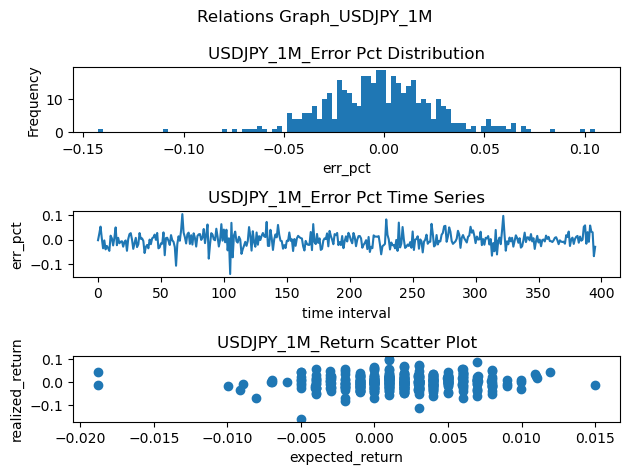

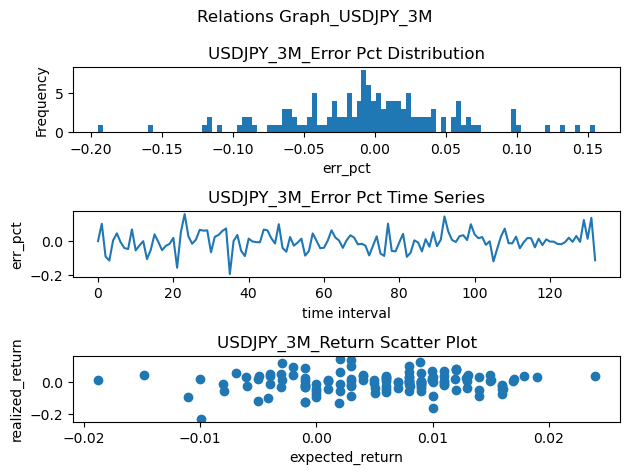

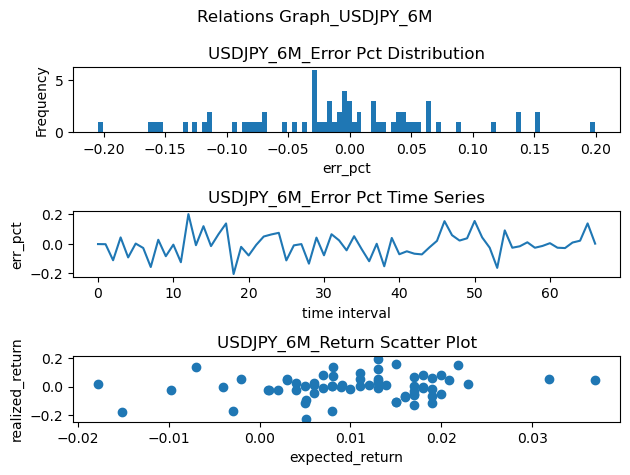

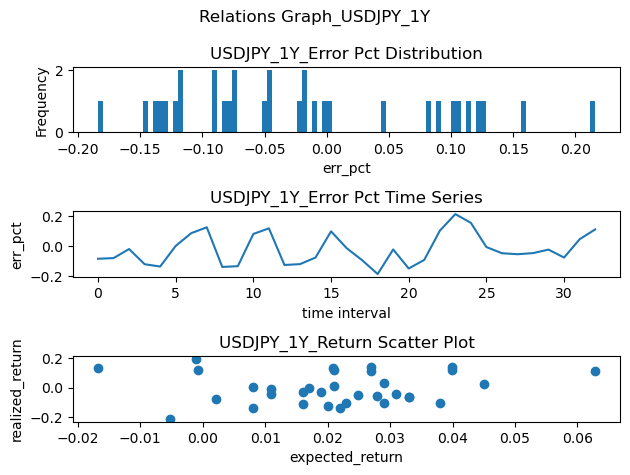

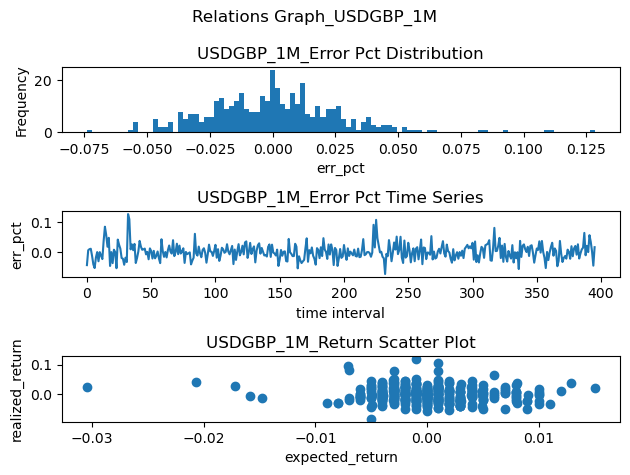

...

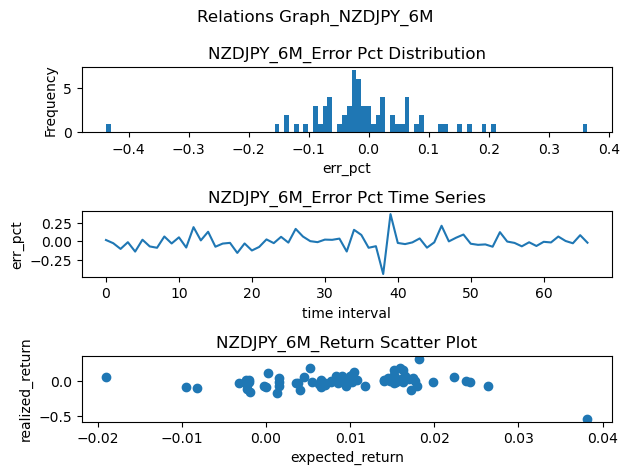

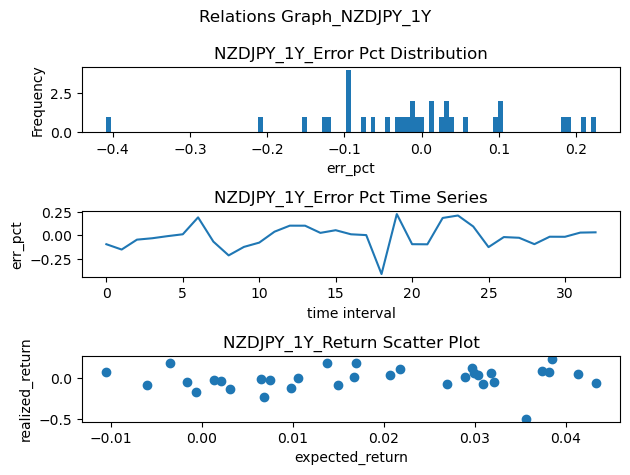

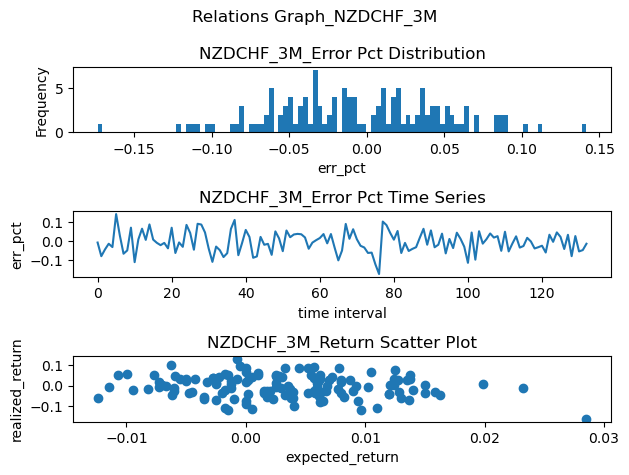

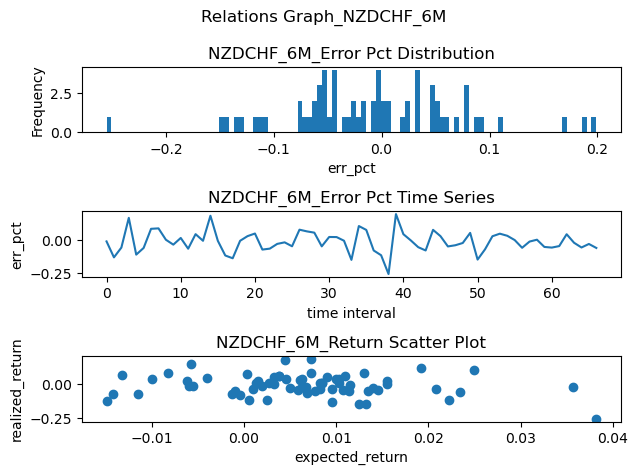

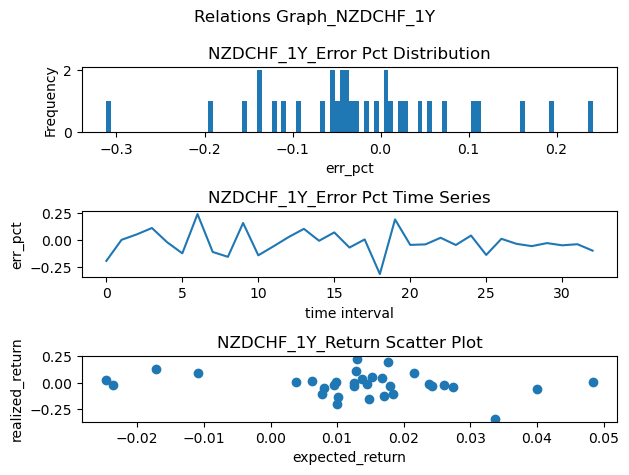

C:\Users\johnn\anaconda3\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\johnn\anaconda3\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


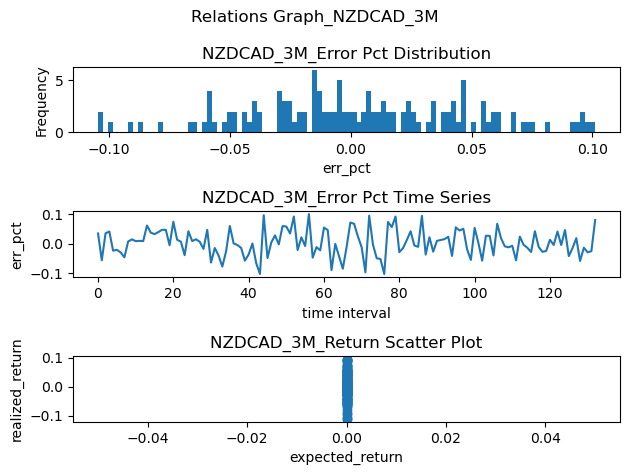

C:\Users\johnn\anaconda3\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\johnn\anaconda3\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


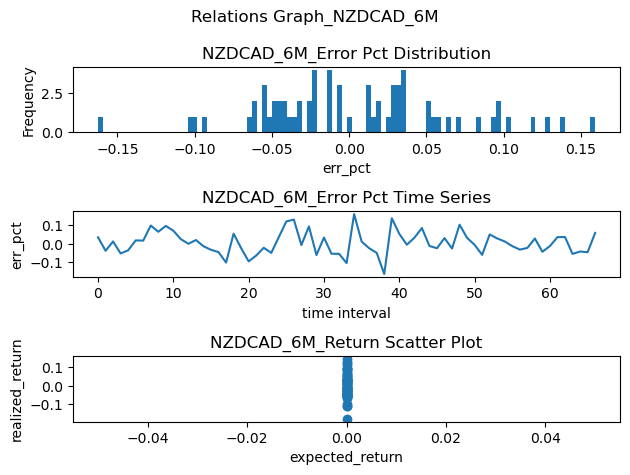

C:\Users\johnn\anaconda3\lib\site-packages\numpy\lib\function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\johnn\anaconda3\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


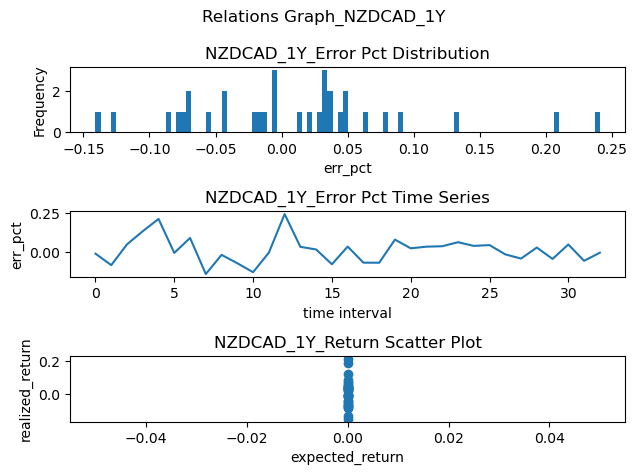

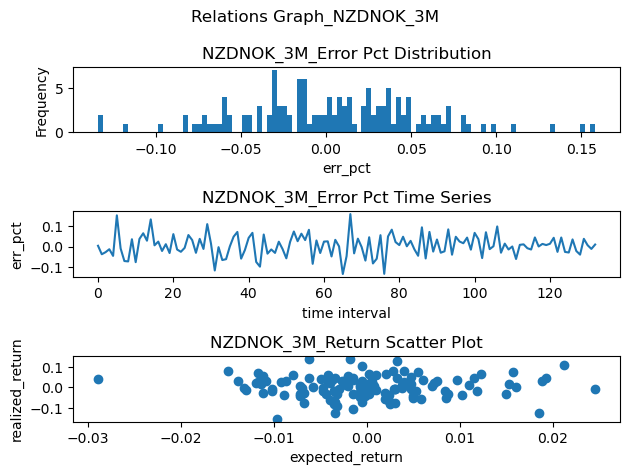

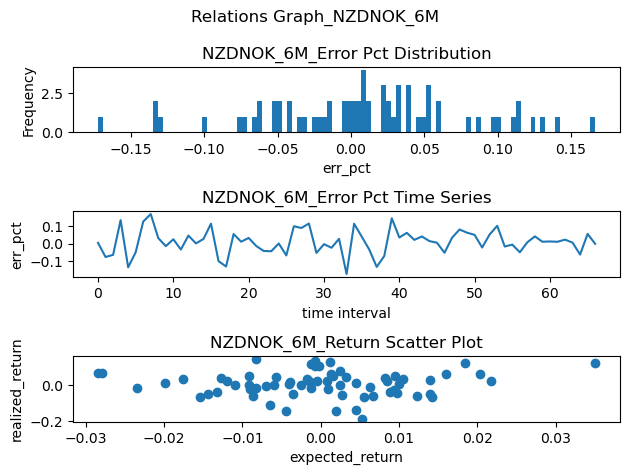

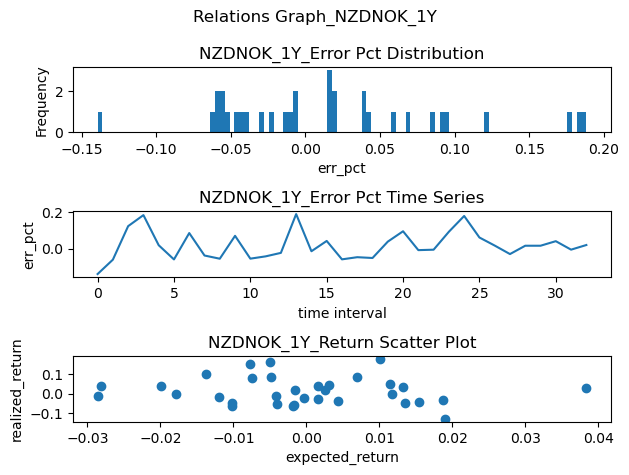

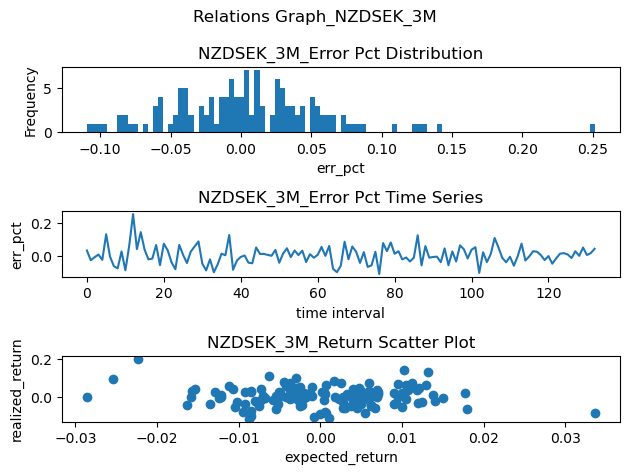

...

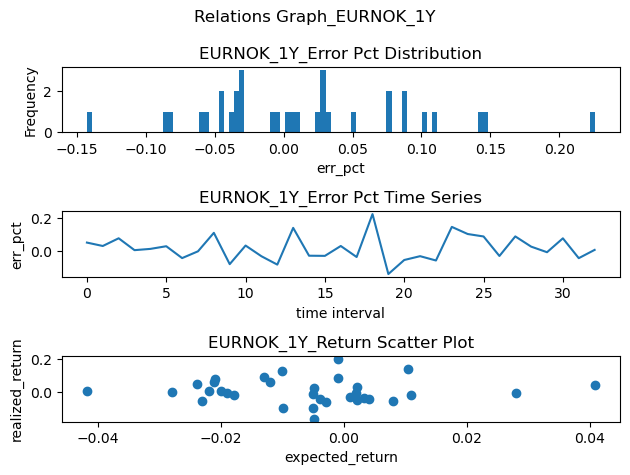

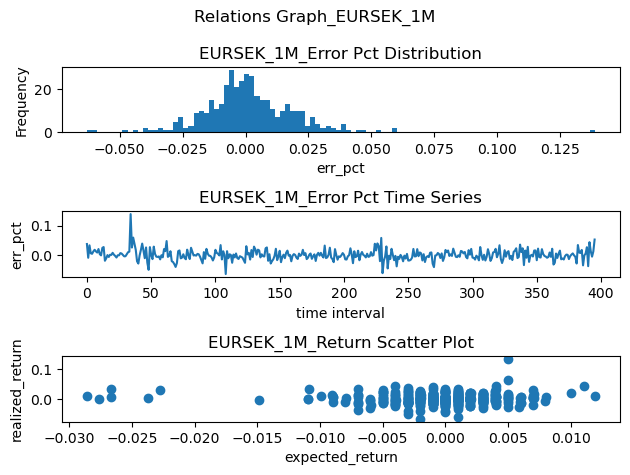

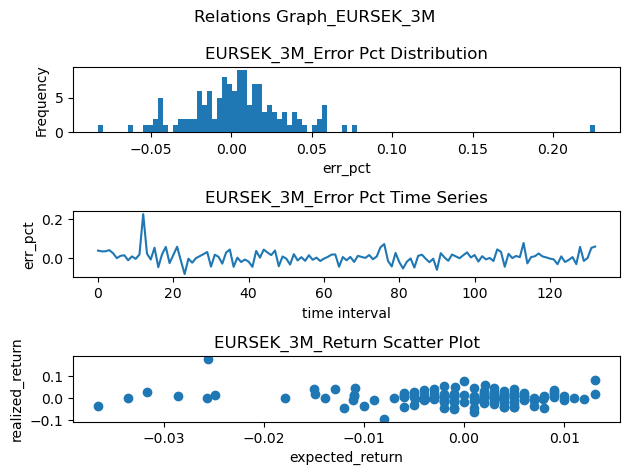

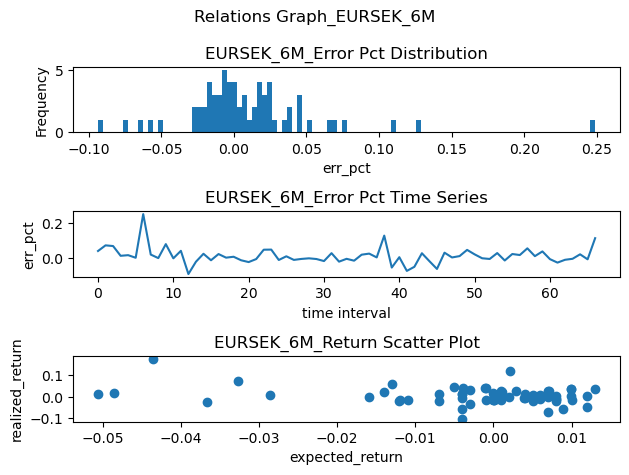

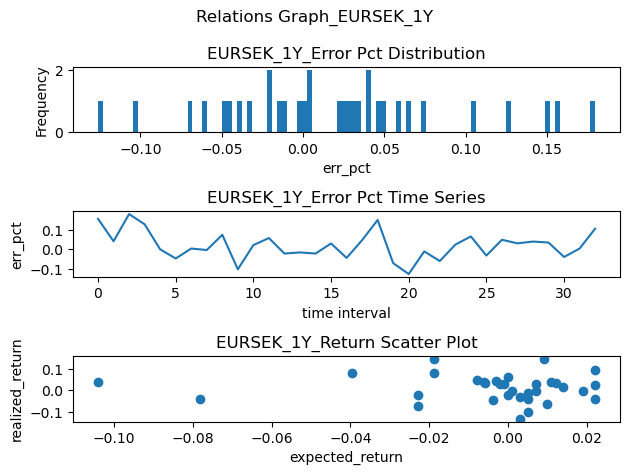

In [7]:
tf_list = ["1M", "3M", "6M", "1Y"] # The timeframe we loop through
prohabit_list = ["AUD", "CAD", "NZD"] # A list that contains only 3M data
curr_pair_1 = ["USD", "JPY", "GBP", "CHF","AUD", "CAD", "NZD", "NOK", "SEK", "EUR"]
curr_pair_2 = ["USD", "JPY", "GBP", "CHF","AUD", "CAD", "NZD", "NOK", "SEK", "EUR"]
gen = ((x, y) for x in curr_pair_1 for y in curr_pair_2) # Cross of curr_pairs

# DataFrame Initialization
err_pct_mean_df = pd.DataFrame()
err_pct_var_df = pd.DataFrame()
ret_corr_df = pd.DataFrame()
error_pct_auto_corr_df = pd.DataFrame()
cpi_err_pct_corr_df = pd.DataFrame()

err_pct_mean_df.index = tf_list
err_pct_var_df.index = tf_list
error_pct_auto_corr_df.index = tf_list
ret_corr_df.index = tf_list
cpi_err_pct_corr_df.index = tf_list

# CPI Phase 3

cpi_new_obj = {
    "1M": [],
    "3M": [],
    "6M": [],
    "1Y": [],
}

err_pct_new_obj = {
    "1M": [],
    "3M": [],
    "6M": [],
    "1Y": []
}
index_list = []

for cp1, cp2 in gen:
    error_pct_mean_ls = []
    error_pct_var_ls = []
    ret_corr_ls = []
    error_pct_auto_corr_ls = []
    cpi_err_pct_corr_ls = []
    
    if cp1 != cp2:
        for tf in tf_list:
            # In case there're no monthly returns
            if (cp1 in prohabit_list or cp2 in prohabit_list) and tf == "1M":
                error_pct_mean_ls.append(np.nan)
                error_pct_var_ls.append(np.nan)
                ret_corr_ls.append(np.nan)
                error_pct_auto_corr_ls.append(np.nan)
                cpi_new_obj[f"{tf}"].append(np.nan)
                err_pct_new_obj[f"{tf}"].append(np.nan)
                continue
            
            if (cp1 + cp2) in available_list:
                S_0 = FXAPI(tf, cp1 + cp2).get_curr_data().first()
                S_1 = FXAPI(tf, cp1 + cp2).get_curr_data().last()
                realized_return = np.log(S_1/S_0)
                
                index_list.append(cp1 + cp2)
                # CPI Data
                CPI_1 = FXAPI(tf, cp1).get_cpi_data().prod()
                CPI_2 = FXAPI(tf, cp2).get_cpi_data().prod()
                cpi_spread = CPI_2 - CPI_1 
                a, b, c = merge_pair_data(realized_return, CPI_1, CPI_2) # a = realized return, b = CPI_1, c = CPI_2
                
                # Calculate the expected returns
                expected_return = np.log(b/c)
                expected_S_1 = S_0 * np.exp(expected_return)
                err_pct = (S_1 - expected_S_1) / expected_S_1
                
                
                # Result Aggragated DataFrame
                Aggregated_df = pd.DataFrame()
                Aggregated_df["start_date"] = S_0.index.shift(-1)
                Aggregated_df["end_date"] = S_0.index
                Aggregated_df["initial_spot"] = S_0.values
                Aggregated_df["expected_spot"] = expected_S_1.values
                Aggregated_df["realized_spot"] = S_1.values
                Aggregated_df["spot_error_pct"] = err_pct.values
                Aggregated_df["expected_ret"] = expected_return.values
                Aggregated_df["realized_ret"] = realized_return.values
                
                # Result Metrics
                error_mean = np.mean(err_pct)
                error_var = np.var(err_pct)
                ret_corr = np.corrcoef(expected_return , realized_return)[1,0]
                ret_corr_2 = np.corrcoef(err_pct[:-1], err_pct[1:])[1,0]
                cpi_err_pct_corr = np.corrcoef(cpi_spread, err_pct)[1,0]
                
                # Get the data for a broader view
                error_pct_mean_ls.append(error_mean)
                error_pct_var_ls.append(error_var)
                ret_corr_ls.append(ret_corr)
                error_pct_auto_corr_ls.append(ret_corr_2)
                cpi_err_pct_corr_ls.append(cpi_err_pct_corr) # Phase 3 Part I
                
                # Phase 2 Part III - CPI Sprread & Error_pct_obj
                cpi_new_obj[f"{tf}"].append(np.mean(cpi_spread))
                err_pct_new_obj[f"{tf}"].append(error_mean)
                
                # Plot Graphs
                fig, ax = plt.subplots(3)
                fig.suptitle("Relations Graph_" + cp1 + cp2 + "_" + tf)
                
                # Subplot 1 - Frequency Graph
                ax[0].hist(err_pct, bins = 100)
                ax[0].set(xlabel="err_pct", ylabel="Frequency", title= cp1 + cp2 + "_" + tf + "_" + "Error Pct Distribution")

                # Subplot 2 - Error Pct Time Series
                ax[1].plot(range(len(err_pct)), err_pct)
                ax[1].set(xlabel="time interval", ylabel="err_pct",title= cp1 + cp2 + "_" + tf + "_" + 'Error Pct Time Series')

                # Subplot 3 - Return Scatter Graph
                ax[2].scatter(expected_return, realized_return)
                ax[2].set(xlabel="expected_return", ylabel="realized_return", title= cp1 + cp2 + "_" + tf + "_" + "Return Scatter Plot")
           

                fig.tight_layout()
                fig.savefig('C:/Users/johnn/Downloads/graphss/' + "Relations Graph_" + cp1 + cp2 + "_" + tf + ".png" )
                plt.show()
                
                
        if len(error_pct_mean_ls) != 0 and len(error_pct_mean_ls) != 1:
            err_pct_mean_df[cp1 + cp2] = error_pct_mean_ls
            err_pct_var_df[cp1 + cp2] = error_pct_var_ls
            ret_corr_df[cp1 + cp2] = ret_corr_ls
            error_pct_auto_corr_df[cp1 + cp2] = error_pct_auto_corr_ls
            cpi_err_pct_corr_df[cp1 + cp2] = cpi_err_pct_corr

            
err_pct_mean_df.to_csv("err_pct_mean")
err_pct_var_df.to_csv("err_pct_var")
ret_corr_df.to_csv("ret_corr")
error_pct_auto_corr_df.to_csv("err_pct_auto_corr")


# Result of Dataframe

<AxesSubplot:>

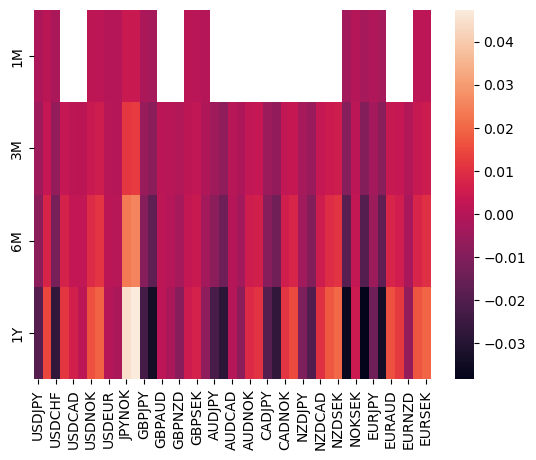

In [8]:
# Phase 1 - 2.1 - Error_Pct_Mean_df
sns.heatmap(err_pct_mean_df)

<AxesSubplot:>

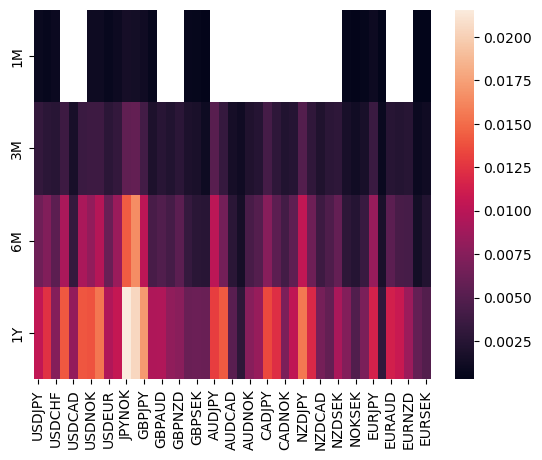

In [9]:
# Phase 1 - 2.2 - Error_Pct_Var_df
sns.heatmap(err_pct_var_df)

<AxesSubplot:>

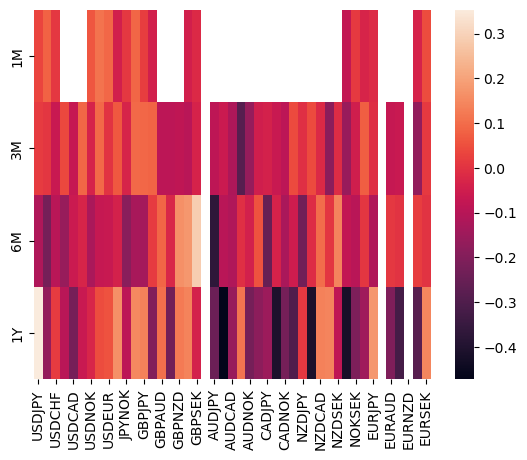

In [10]:
# Phase 1 - 2.3 - Error_pct_auto_correlation
sns.heatmap(error_pct_auto_corr_df)

<AxesSubplot:>

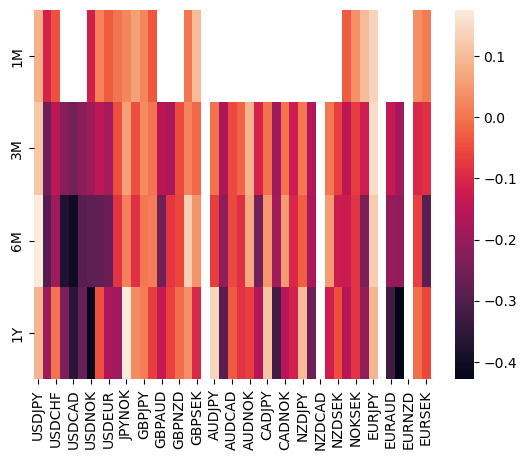

In [11]:
# Phase 1 - 2.4 return correlation
sns.heatmap(ret_corr_df)

In [22]:
# Phase 2 - err pct across pairs
req_data_1 = [[pd.Series(err_pct_new_obj[tf]).dropna().mean()] for tf in tf_list]
err_mean_across_pair_df = pd.DataFrame(data=req_data_1, index = tf_list, columns=["err_pct_across_pairs"])
err_mean_across_pair_df

,err_pct_across_pairs
1M,-0.000192
3M,-0.000134
6M,0.000031
1Y,-0.001205


In [52]:
# Phase 2 - 2.1

# Get the columns of every pairs

req_col = err_pct_mean_df.columns
new_df = pd.DataFrame()
for col in req_col:
    new_df[col] = [np.corrcoef(err_pct_mean_df[col].values, [1,3,6,12])[1,0]]
    # new_df[col] = [np.corrcoef(err_pct_mean_df[col].values, [1,3,6,12])


,USDJPY,USDGBP,USDCHF,USDAUD,USDCAD,USDNZD,USDNOK,USDSEK,USDEUR,JPYCHF,...,NOKCHF,NOKSEK,SEKCHF,EURJPY,EURCHF,EURAUD,EURCAD,EURNZD,EURNOK,EURSEK
0,-0.994962,0.998539,-0.998497,NaN,NaN,NaN,0.998295,0.994234,-0.143783,-0.818921,...,-0.999886,0.984982,-0.999912,-0.98677,-0.999986,NaN,NaN,NaN,0.998953,0.999368


In [28]:
# Phase 2 - 2.2
err_pcsda = err_mean_across_pair_df["err_pct_across_pairs"]
np.corrcoef(err_pcsda, [1,3,6,12])[1,0]

-0.8195749059634608

In [13]:
# Phase 2 - 3.1
cpi_err_pct_corr_df

,USDJPY,USDGBP,USDCHF,USDAUD,USDCAD,USDNZD,USDNOK,USDSEK,USDEUR,JPYCHF,...,NOKCHF,NOKSEK,SEKCHF,EURJPY,EURCHF,EURAUD,EURCAD,EURNZD,EURNOK,EURSEK
1M,-0.082664,-0.34568,-0.158259,-0.382365,-0.50312,-0.404321,-0.521442,-0.217952,-0.328605,-0.323139,...,-0.293632,-0.396424,-0.404796,-0.091798,NaN,-0.506005,-0.552651,NaN,-0.213397,-0.44436
3M,-0.082664,-0.34568,-0.158259,-0.382365,-0.50312,-0.404321,-0.521442,-0.217952,-0.328605,-0.323139,...,-0.293632,-0.396424,-0.404796,-0.091798,NaN,-0.506005,-0.552651,NaN,-0.213397,-0.44436
6M,-0.082664,-0.34568,-0.158259,-0.382365,-0.50312,-0.404321,-0.521442,-0.217952,-0.328605,-0.323139,...,-0.293632,-0.396424,-0.404796,-0.091798,NaN,-0.506005,-0.552651,NaN,-0.213397,-0.44436
1Y,-0.082664,-0.34568,-0.158259,-0.382365,-0.50312,-0.404321,-0.521442,-0.217952,-0.328605,-0.323139,...,-0.293632,-0.396424,-0.404796,-0.091798,NaN,-0.506005,-0.552651,NaN,-0.213397,-0.44436


In [17]:
# Phase 2 - 3.2
required_data = [[np.corrcoef(pd.Series(cpi_new_obj[tf]).dropna(), pd.Series(err_pct_new_obj[tf]).dropna())[1,0]] for tf in tf_list]
err_pct_mean_cpi_spread_df = pd.DataFrame(data=required_data, index = tf_list, columns=["err_pct_mean_cpi_spread_corr"])
err_pct_mean_cpi_spread_df

,err_pct_mean_cpi_spread_corr
1M,-0.859005
3M,-0.834804
6M,-0.814185
1Y,-0.837434


In [19]:
# Aggragated Dataframe (2.1 - 2.4)
err_pct_mean_df.T # Error_Pct Mean
err_pct_var_df.T # Error_Pct Var
error_pct_auto_corr_df.T # Error_Pct Time-Lag1 Corr
ret_corr_df.T # Error_Pct Correlation

,1M,3M,6M,1Y
USDJPY,0.084999,0.116418,0.175191,0.088921
USDGBP,-0.108820,-0.262421,-0.294142,-0.193120
USDCHF,-0.044008,-0.147174,-0.190874,-0.001701
USDAUD,NaN,-0.224133,-0.378540,-0.233772
USDCAD,NaN,-0.249301,-0.406653,-0.359963
USDNZD,NaN,-0.213898,-0.288713,-0.267059
USDNOK,-0.116703,-0.193034,-0.279948,-0.420922
USDSEK,0.016661,-0.144819,-0.278637,-0.044145
USDEUR,-0.031835,-0.179011,-0.263540,-0.178428
JPYCHF,-0.000541,-0.048451,-0.083467,-0.185972


In [27]:
# Aggragated DataFrame (2.5) - Check Above Aggragated DF

,1M,3M,6M,1Y,5Y
USDJPY,0.085094,0.116328,0.175156,0.092747,-0.263490
USDGBP,-0.108565,-0.260855,-0.291155,-0.189834,-0.475162
USDCHF,-0.043712,-0.146849,-0.188975,0.001347,0.347538
USDAUD,0.000000,-0.222611,-0.372461,-0.229090,0.398598
USDCAD,0.000000,-0.248252,-0.403003,-0.356886,0.352174
USDNZD,0.000000,-0.212130,-0.282763,-0.262242,0.521236
JPYCHF,-0.000501,-0.048521,-0.082319,-0.185461,-0.556313
GBPJPY,0.023170,0.030367,0.003692,0.012298,-0.639829
GBPCHF,-0.039119,-0.001629,0.011244,-0.070676,-0.284808
GBPAUD,0.000000,-0.153215,-0.254878,-0.131626,-0.143366
